In [2]:
pip install imblearn

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install ydata-profiling

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import warnings
warnings.filterwarnings('ignore')
from category_encoders import MEstimateEncoder
from imblearn.over_sampling import SMOTE
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [4]:
df = pd.read_csv("application_record.csv")

In [5]:
df2 = pd.read_csv("credit_record.csv")

In [27]:
df.describe(include='all')

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
count,4.385570e+05,438557,438557,438557,438557.000000,4.385570e+05,438557,438557,438557,438557,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,304354,438557.000000
unique,NaN,2,2,2,NaN,NaN,5,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN
freq,NaN,294440,275459,304074,NaN,NaN,226104,301821,299828,393831,NaN,NaN,NaN,NaN,NaN,NaN,78240,NaN
mean,6.022176e+06,NaN,NaN,NaN,0.427390,1.875243e+05,NaN,NaN,NaN,NaN,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,NaN,2.194465
std,5.716370e+05,NaN,NaN,NaN,0.724882,1.100869e+05,NaN,NaN,NaN,NaN,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,NaN,0.897207
min,5.008804e+06,NaN,NaN,NaN,0.000000,2.610000e+04,NaN,NaN,NaN,NaN,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,NaN,1.000000
25%,5.609375e+06,NaN,NaN,NaN,0.000000,1.215000e+05,NaN,NaN,NaN,NaN,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
50%,6.047745e+06,NaN,NaN,NaN,0.000000,1.607805e+05,NaN,NaN,NaN,NaN,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
75%,6.456971e+06,NaN,NaN,NaN,1.000000,2.250000e+05,NaN,NaN,NaN,NaN,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,NaN,3.000000


In [28]:
df.shape

(438557, 18)

In [29]:
df2.describe(include='all')

,ID,MONTHS_BALANCE,STATUS
count,1.048575e+06,1.048575e+06,1048575
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,442031
mean,5.068286e+06,-1.913700e+01,NaN
std,4.615058e+04,1.402350e+01,NaN
min,5.001711e+06,-6.000000e+01,NaN
25%,5.023644e+06,-2.900000e+01,NaN
50%,5.062104e+06,-1.700000e+01,NaN
75%,5.113856e+06,-7.000000e+00,NaN


In [30]:
df2.shape

(1048575, 3)

In [31]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile = ProfileReport(df2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#each customer transaction history
grouped=df2.groupby('ID')['STATUS'].value_counts()
grouped

ID       STATUS
5001711  0          3
         X          1
5001712  0         10
         C          9
5001713  X         22
                   ..
5150483  X         18
5150484  0         12
         C          1
5150485  0          2
5150487  C         30
Name: STATUS, Length: 94143, dtype: int64

<AxesSubplot: xlabel='STATUS'>

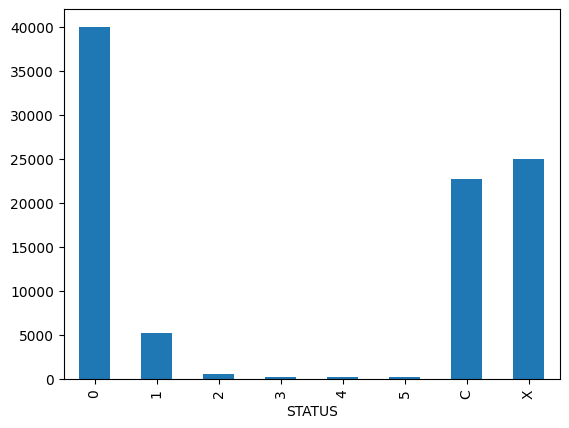

In [7]:
z=grouped.groupby('STATUS').count()
z.plot(kind='bar')

#most customer had past due record of 1-29 days (0)
#second high is customer without a balance - did not use the card (X)
#third high is customer paid off the balance that month (C)
#low presentage on delinquent (1-5) 

In [8]:
history=pd.get_dummies(data=df2,columns=['STATUS'],
                              prefix='',prefix_sep='').groupby('ID')[sorted(df2['STATUS'].unique().tolist())].sum()
history=history.rename(columns=
                      {'0':'pastdue',
                       '1':'30+',
                       '2':'60+',
                       '3':'90+',
                       '4':'120+',
                       '5':'150+',
                       'C':'paid_off',
                       'X':'no_usage',
                      })

overall_pastdue=['30+',	'60+',	'90+'	,'120+',	'150+']
history['number_of_months']=df2.groupby('ID')['MONTHS_BALANCE'].count()
history['over_90']=history[['90+','120+','150+']].sum(axis=1)
history['less_90']=history[['pastdue','30+','60+']].sum(axis=1)
history['overall_pastdue']=history[overall_pastdue].sum(axis=1)
history['pastdue_ratio']=round(history['pastdue']/ history['number_of_months'], 2)
history['overdue_ratio']=round(history['overall_pastdue']/ history['number_of_months'], 2)
history.head()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.0
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.0
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.0
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.0
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.0


In [ ]:
history.sum()

pastdue              383120.00
30+                   11090.00
60+                     868.00
90+                     320.00
120+                    223.00
150+                   1693.00
paid_off             442031.00
no_usage             209230.00
number_of_months    1048575.00
over_90                2236.00
less_90              395078.00
overall_pastdue       14194.00
pastdue_ratio         21215.32
overdue_ratio           667.91
class                 41558.00
dtype: float64

In [ ]:
history.head(20)

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.00
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.00
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.00
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.00
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.00
5001717,17,0,0,0,0,0,5,0,22,0,17,0,0.77,0.00
5001718,24,2,0,0,0,0,3,10,39,0,26,2,0.62,0.05
5001719,2,0,0,0,0,0,41,0,43,0,2,0,0.05,0.00
5001720,29,7,0,0,0,0,0,0,36,0,36,7,0.81,0.19


In [9]:
#specify dependent variable 
target=[]
for index,row in history.iterrows() :
  if row['number_of_months'] < 6 :
    target.append(1)
  elif row['150+'] > 0 or (row['no_usage'] == row['number_of_months']) or (row['over_90'] > row['less_90']):
    target.append(0)
  elif row['pastdue_ratio'] > 0.70 and row['overall_pastdue'] >= 1 :
    target.append(0) 
  elif row['overdue_ratio'] > 0.10 and row['over_90'] >= 1 :
    target.append(0)
  else:
    target.append(1)

history['class']=target
history['class'].value_counts()

1    40200
0     5785
Name: class, dtype: int64

In [79]:
#unbalance set
history.describe()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000
mean,8.331412,0.241166,0.018876,0.006959,0.004849,0.036816,9.612504,4.549962,22.802544,0.048625,8.591454,0.308666,0.461353,0.014525,0.874198
std,8.234128,0.990994,0.197607,0.101931,0.084188,0.855981,13.625156,9.622719,15.492771,0.935266,8.442478,1.512753,0.348173,0.061086,0.331630
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,3.000000,34.000000,0.000000,12.000000,0.000000,0.800000,0.000000,1.000000
max,61.000000,38.000000,8.000000,8.000000,7.000000,48.000000,60.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [6]:
df.duplicated().sum()

0

In [10]:
#merging 2 sets
features=['no_usage','number_of_months','over_90','less_90','overall_pastdue','pastdue_ratio','overdue_ratio','class']
new_features=history.loc[:,features]
mdf=pd.merge(df,new_features,on='ID')
mdf.index=mdf['ID']
mdf.drop('ID',axis=1, inplace=True)
mdf.drop_duplicates(inplace=True)
mdf.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,...,OCCUPATION_TYPE,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
ID,,,,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,...,NaN,2.0,1,16,0,2,1,0.06,0.06,1
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,...,NaN,2.0,1,15,0,2,1,0.07,0.07,1
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,...,Security staff,2.0,16,30,0,7,0,0.23,0.00,1
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,...,Sales staff,1.0,3,5,0,2,0,0.40,0.00,1
5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,...,Sales staff,1.0,5,5,0,0,0,0.00,0.00,1


In [ ]:
mdf.duplicated().sum()

0

In [ ]:
mdf.describe()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,30537.000000,3.053700e+04,30537.000000,30537.000000,30537.0,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000
mean,0.427907,1.867250e+05,-15982.492714,58913.724138,1.0,0.227855,0.295445,0.092118,2.198972,4.088843,22.388447,0.060680,8.481874,0.341815,0.462412,0.016215,0.882667
std,0.746653,1.011290e+05,4197.295214,137344.739349,0.0,0.419455,0.456250,0.289197,0.913487,8.836050,15.125662,0.994558,8.131223,1.591154,0.346641,0.066069,0.321822
min,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.215000e+05,-19441.000000,-3163.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,0.000000,1.575000e+05,-15578.000000,-1552.000000,1.0,0.000000,0.000000,0.000000,2.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,1.000000,2.250000e+05,-12477.000000,-410.000000,1.0,0.000000,1.000000,0.000000,3.000000,3.000000,33.000000,0.000000,11.000000,0.000000,0.800000,0.000000,1.000000
max,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [ ]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30537 entries, 5008804 to 5150337
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          30537 non-null  object 
 1   FLAG_OWN_CAR         30537 non-null  object 
 2   FLAG_OWN_REALTY      30537 non-null  object 
 3   CNT_CHILDREN         30537 non-null  int64  
 4   AMT_INCOME_TOTAL     30537 non-null  float64
 5   NAME_INCOME_TYPE     30537 non-null  object 
 6   NAME_EDUCATION_TYPE  30537 non-null  object 
 7   NAME_FAMILY_STATUS   30537 non-null  object 
 8   NAME_HOUSING_TYPE    30537 non-null  object 
 9   DAYS_BIRTH           30537 non-null  int64  
 10  DAYS_EMPLOYED        30537 non-null  int64  
 11  FLAG_MOBIL           30537 non-null  int64  
 12  FLAG_WORK_PHONE      30537 non-null  int64  
 13  FLAG_PHONE           30537 non-null  int64  
 14  FLAG_EMAIL           30537 non-null  int64  
 15  OCCUPATION_TYPE      30537 n

In [ ]:
mdf.corr()

/var/folders/0h/ryslf10s1c12hsb45x6nnj0c0000gn/T/ipykernel_5046/2632886291.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mdf.corr()


,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
CNT_CHILDREN,1.000000,0.029845,0.335072,-0.226616,NaN,0.041995,-0.021877,0.015515,0.890418,-0.001916,-0.006402,-0.001496,0.002289,0.006519,0.001961,0.003251,-0.008424
AMT_INCOME_TOTAL,0.029845,1.000000,0.066394,-0.168678,NaN,-0.033334,0.017287,0.094698,0.020871,0.025747,0.023974,0.009642,0.041301,0.016189,0.004478,0.013161,-0.036609
DAYS_BIRTH,0.335072,0.066394,1.000000,-0.614392,NaN,0.179841,-0.028041,0.105310,0.298083,-0.012933,-0.059289,-0.010360,-0.038398,0.017845,-0.004920,0.031417,-0.011685
DAYS_EMPLOYED,-0.226616,-0.168678,-0.614392,1.000000,NaN,-0.243659,-0.008205,-0.085018,-0.220233,-0.003313,-0.006456,0.005289,-0.015028,-0.013582,-0.000221,-0.016955,0.012329
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.041995,-0.033334,0.179841,-0.243659,NaN,1.000000,0.308065,-0.034274,0.058080,0.014666,0.015496,0.007205,0.003035,0.012348,-0.015213,0.006198,-0.001115
FLAG_PHONE,-0.021877,0.017287,-0.028041,-0.008205,NaN,0.308065,1.000000,0.014622,-0.012660,0.019077,0.017005,0.011658,0.020899,0.005149,0.000697,0.001095,-0.011246
FLAG_EMAIL,0.015515,0.094698,0.105310,-0.085018,NaN,-0.034274,0.014622,1.000000,0.010821,-0.003792,0.005116,-0.003039,0.023570,0.003023,0.008472,0.009884,-0.005609
CNT_FAM_MEMBERS,0.890418,0.020871,0.298083,-0.220233,NaN,0.058080,-0.012660,0.010821,1.000000,0.006034,0.012177,-0.001503,0.013157,0.004509,-0.000761,0.000167,-0.007139
no_usage,-0.001916,0.025747,-0.012933,-0.003313,NaN,0.014666,0.019077,-0.003792,0.006034,1.000000,0.274482,-0.000222,-0.207403,-0.041042,-0.383350,-0.070949,-0.475954


In [ ]:
profile = ProfileReport(mdf)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [132]:
#split the merged set into features and label
y = mdf['class']
x = mdf.drop(columns=['class'],axis=1)
x

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,...,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,...,0,NaN,2.0,1,16,0,2,1,0.06,0.06
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,...,0,NaN,2.0,1,15,0,2,1,0.07,0.07
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,...,0,Security staff,2.0,16,30,0,7,0,0.23,0.00
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,...,1,Sales staff,1.0,3,5,0,2,0,0.40,0.00
5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,...,1,Sales staff,1.0,5,5,0,0,0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5149828,M,Y,Y,0,315000.0,Working,Secondary / secondary special,Married,House / apartment,-17348,...,0,Managers,2.0,8,12,4,0,4,0.00,0.33
5149834,F,N,Y,0,157500.0,Commercial associate,Higher education,Married,House / apartment,-12387,...,1,Medicine staff,2.0,0,24,9,10,18,0.04,0.75
5149838,F,N,Y,0,157500.0,Pensioner,Higher education,Married,House / apartment,-12387,...,1,Medicine staff,2.0,0,33,9,10,18,0.03,0.55


In [133]:
#split data into 70/30 training and testing sets
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [134]:
#preprocess - drop constant value
x_train=x_train.drop(['FLAG_MOBIL'],axis=1)

In [135]:
#preprocess - missing value
x_train['OCCUPATION_TYPE'].fillna('Other',inplace=True)

In [136]:
#preprocess - change applicant days of birth and employment into years
x_train['AGE']=-(x_train['DAYS_BIRTH'])//365
x_train['TENURE'] =-(x_train['DAYS_EMPLOYED'])//365
x_train['TENURE']= x_train['TENURE'].replace(-1001,-1)
x_train.drop(['DAYS_BIRTH','DAYS_EMPLOYED'],axis = 1,inplace=True)

In [137]:
#adjusting datatype for encoding
x_train['AMT_INCOME_TOTAL']=x_train['AMT_INCOME_TOTAL'].astype('int64')
x_train['FLAG_WORK_PHONE']=x_train['FLAG_WORK_PHONE'].astype('object')
x_train['FLAG_PHONE']=x_train['FLAG_PHONE'].astype('object')
x_train['FLAG_EMAIL']=x_train['FLAG_EMAIL'].astype('object')
x_train['no_usage']=x_train['no_usage'].astype('int64')
x_train['CNT_FAM_MEMBERS']=x_train['CNT_FAM_MEMBERS'].astype('int64')


In [138]:
cat_train=x_train.select_dtypes('object')
cat_train.nunique()

CODE_GENDER             2
FLAG_OWN_CAR            2
FLAG_OWN_REALTY         2
NAME_INCOME_TYPE        5
NAME_EDUCATION_TYPE     5
NAME_FAMILY_STATUS      5
NAME_HOUSING_TYPE       6
FLAG_WORK_PHONE         2
FLAG_PHONE              2
FLAG_EMAIL              2
OCCUPATION_TYPE        19
dtype: int64

In [139]:
#since occupation type is high cardinality, use target encoding
from category_encoders import MEstimateEncoder
target=MEstimateEncoder(m=7,cols=['OCCUPATION_TYPE'])
# train with 25% of the data to prevent overfitting 
x_encode=x_train.sample(frac=0.25)
y_encode=y_train[x_encode.index]
target.fit(x_encode,y_encode)
x_encoded=target.transform(x_encode)
x_encoded['OCCUPATION_TYPE'].unique()

array([0.9297584 , 0.86216268, 0.86843406, 0.83050959, 0.89298311,
       0.86847749, 0.88043823, 0.89152747, 0.88158423, 0.89136459,
       0.91961612, 0.86405509, 0.88277352, 0.90932822, 0.90079417,
       0.82373129, 0.89925358, 0.88666027])

In [140]:
x_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5344 entries, 5061221 to 5149186
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          5344 non-null   object 
 1   FLAG_OWN_CAR         5344 non-null   object 
 2   FLAG_OWN_REALTY      5344 non-null   object 
 3   CNT_CHILDREN         5344 non-null   int64  
 4   AMT_INCOME_TOTAL     5344 non-null   int64  
 5   NAME_INCOME_TYPE     5344 non-null   object 
 6   NAME_EDUCATION_TYPE  5344 non-null   object 
 7   NAME_FAMILY_STATUS   5344 non-null   object 
 8   NAME_HOUSING_TYPE    5344 non-null   object 
 9   FLAG_WORK_PHONE      5344 non-null   object 
 10  FLAG_PHONE           5344 non-null   object 
 11  FLAG_EMAIL           5344 non-null   object 
 12  OCCUPATION_TYPE      5344 non-null   float64
 13  CNT_FAM_MEMBERS      5344 non-null   int64  
 14  no_usage             5344 non-null   int64  
 15  number_of_months     5344 non

In [141]:
#one-hot encoding for the rest of categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for x in x_encoded:
    if x_encoded[x].dtypes=='object':
        x_encoded[x] = le.fit_transform(x_encoded[x])

In [142]:
x_encoded.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,...,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,AGE,TENURE
ID,,,,,,,,,,,,,,,,,,,,,
5061221,0,1,1,0,157500,4,4,1,1,0,...,2,3,25,0,1,0,0.04,0.0,57,3
5135521,0,1,0,0,202500,4,4,1,1,0,...,2,14,24,0,9,0,0.38,0.0,40,22
5009397,0,0,0,1,76500,4,1,0,1,1,...,3,0,59,0,4,0,0.07,0.0,34,1
5115907,0,0,1,1,157500,0,4,0,1,0,...,3,4,4,0,0,0,0.00,0.0,40,0
5048068,0,0,1,0,193500,4,1,3,1,0,...,1,0,8,0,8,0,1.00,0.0,46,13


In [143]:
y_index = x_encoded.index
y_encoded = y_train.loc[y_index]

In [144]:
#balancing the dataset
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
x_smoted, y_smoted = oversample.fit_resample(x_encoded,y_encoded)
y_smoted = pd.Series(y_smoted)
y_smoted.value_counts()


1    4723
0    4723
Name: class, dtype: int64

In [145]:
x_encode.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5344 entries, 5061221 to 5149186
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          5344 non-null   object 
 1   FLAG_OWN_CAR         5344 non-null   object 
 2   FLAG_OWN_REALTY      5344 non-null   object 
 3   CNT_CHILDREN         5344 non-null   int64  
 4   AMT_INCOME_TOTAL     5344 non-null   int64  
 5   NAME_INCOME_TYPE     5344 non-null   object 
 6   NAME_EDUCATION_TYPE  5344 non-null   object 
 7   NAME_FAMILY_STATUS   5344 non-null   object 
 8   NAME_HOUSING_TYPE    5344 non-null   object 
 9   FLAG_WORK_PHONE      5344 non-null   object 
 10  FLAG_PHONE           5344 non-null   object 
 11  FLAG_EMAIL           5344 non-null   object 
 12  OCCUPATION_TYPE      5344 non-null   object 
 13  CNT_FAM_MEMBERS      5344 non-null   int64  
 14  no_usage             5344 non-null   int64  
 15  number_of_months     5344 non

In [146]:
x_smoted.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,...,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,AGE,TENURE
count,9446.000000,9446.000000,9446.000000,9446.000000,9.446000e+03,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,...,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000
mean,0.251853,0.295469,0.561508,0.326170,1.913124e+05,2.177641,3.006246,1.269532,1.272708,0.157527,...,2.052721,8.550921,22.010798,0.206966,7.461148,0.609253,0.377264,0.030618,43.031548,5.208448
std,0.434100,0.456277,0.496229,0.643251,1.043377e+05,1.674772,1.305793,0.863456,0.881160,0.364316,...,0.834268,12.204456,13.660432,1.746580,8.907853,2.358382,0.365503,0.085552,10.872594,5.921085
min,0.000000,0.000000,0.000000,0.000000,2.700000e+04,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.000000,-1.000000
25%,0.000000,0.000000,0.000000,0.000000,1.215788e+05,1.000000,1.000000,1.000000,1.000000,0.000000,...,2.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.000000,1.000000
50%,0.000000,0.000000,1.000000,0.000000,1.710000e+05,2.000000,4.000000,1.000000,1.000000,0.000000,...,2.000000,2.000000,19.000000,0.000000,5.000000,0.000000,0.280000,0.000000,42.000000,4.000000
75%,1.000000,1.000000,1.000000,0.000000,2.250000e+05,4.000000,4.000000,1.000000,1.000000,0.000000,...,2.000000,13.000000,31.000000,0.000000,11.000000,0.000000,0.750000,0.013344,52.000000,8.000000
max,1.000000,1.000000,1.000000,14.000000,1.350000e+06,4.000000,4.000000,4.000000,5.000000,1.000000,...,15.000000,61.000000,61.000000,47.000000,56.000000,49.000000,1.000000,0.950000,68.000000,42.000000


In [147]:
# normalization
norm_train=(x_smoted-x_smoted.min())/(x_smoted.max()-x_smoted.min())
print(norm_train)

      CODE_GENDER  FLAG_OWN_CAR  FLAG_OWN_REALTY  CNT_CHILDREN  \
0             0.0           1.0              1.0      0.000000   
1             0.0           1.0              0.0      0.000000   
2             0.0           0.0              0.0      0.071429   
3             0.0           0.0              1.0      0.071429   
4             0.0           0.0              1.0      0.000000   
...           ...           ...              ...           ...   
9441          0.0           0.0              0.0      0.000000   
9442          0.0           1.0              0.0      0.000000   
9443          0.0           0.0              1.0      0.000000   
9444          1.0           0.0              0.0      0.071429   
9445          0.0           0.0              0.0      0.000000   

      AMT_INCOME_TOTAL  NAME_INCOME_TYPE  NAME_EDUCATION_TYPE  \
0             0.098639               1.0                 1.00   
1             0.132653               1.0                 1.00   
2           

In [148]:
norm_train.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,...,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,AGE,TENURE
count,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,...,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000,9446.000000
mean,0.251853,0.295469,0.561508,0.023298,0.124197,0.544410,0.751562,0.317383,0.254542,0.157527,...,0.075194,0.140179,0.350180,0.004404,0.133235,0.012434,0.377264,0.032229,0.468756,0.144383
std,0.434100,0.456277,0.496229,0.045946,0.078864,0.418693,0.326448,0.215864,0.176232,0.364316,...,0.059591,0.200073,0.227674,0.037161,0.159069,0.048130,0.365503,0.090055,0.231332,0.137700
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.071488,0.250000,0.250000,0.250000,0.200000,0.000000,...,0.071429,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.276596,0.046512
50%,0.000000,0.000000,1.000000,0.000000,0.108844,0.500000,1.000000,0.250000,0.200000,0.000000,...,0.071429,0.032787,0.300000,0.000000,0.089286,0.000000,0.280000,0.000000,0.446809,0.116279
75%,1.000000,1.000000,1.000000,0.000000,0.149660,1.000000,1.000000,0.250000,0.200000,0.000000,...,0.071429,0.213115,0.500000,0.000000,0.196429,0.000000,0.750000,0.014047,0.659574,0.209302
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [149]:
norm_train.skew()

CODE_GENDER             1.143515
FLAG_OWN_CAR            0.896710
FLAG_OWN_REALTY        -0.247952
CNT_CHILDREN            2.906550
AMT_INCOME_TOTAL        2.341877
NAME_INCOME_TYPE       -0.086999
NAME_EDUCATION_TYPE    -0.709578
NAME_FAMILY_STATUS      1.346789
NAME_HOUSING_TYPE       3.341893
FLAG_WORK_PHONE         1.880485
FLAG_PHONE              1.348438
FLAG_EMAIL              3.807035
OCCUPATION_TYPE        -0.997187
CNT_FAM_MEMBERS         1.242526
no_usage                1.603233
number_of_months        0.695083
over_90                16.117544
less_90                 1.648698
overall_pastdue         9.602839
pastdue_ratio           0.427522
overdue_ratio           5.073220
AGE                     0.196229
TENURE                  1.678239
dtype: float64

In [150]:
norm_train.corr()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,...,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,AGE,TENURE
CODE_GENDER,1.000000,0.387048,-0.004830,0.098978,0.180699,0.106367,0.037943,-0.047798,0.100815,0.112633,...,0.136988,-0.087404,0.017396,-0.003264,0.051911,-0.000249,0.075882,-0.014803,-0.195746,0.008778
FLAG_OWN_CAR,0.387048,1.000000,0.058841,0.112788,0.173201,0.098400,-0.031530,-0.057043,-0.008197,0.096394,...,0.149043,-0.060492,0.038217,-0.024796,0.052305,-0.034085,0.055986,-0.069775,-0.139834,0.023287
FLAG_OWN_REALTY,-0.004830,0.058841,1.000000,0.051411,0.033084,-0.031366,0.015828,0.071512,-0.147569,-0.112165,...,0.043316,-0.120472,-0.020496,-0.011941,0.027283,-0.028270,0.080314,-0.052506,0.128529,-0.030651
CNT_CHILDREN,0.098978,0.112788,0.051411,1.000000,0.012546,0.106799,-0.020073,-0.092916,0.019574,0.086139,...,0.848079,-0.094235,0.009684,-0.000534,0.059058,0.001249,0.062885,-0.033037,-0.293237,0.037827
AMT_INCOME_TOTAL,0.180699,0.173201,0.033084,0.012546,1.000000,-0.114515,-0.262163,0.006267,0.006366,-0.051109,...,-0.004595,0.039524,0.026277,0.079335,0.029760,0.078894,0.008775,0.087543,-0.090467,0.065263
NAME_INCOME_TYPE,0.106367,0.098400,-0.031366,0.106799,-0.114515,1.000000,0.106196,-0.014517,0.021265,0.175377,...,0.112266,-0.036557,-0.000662,-0.068999,-0.002788,-0.051342,-0.001657,-0.070292,-0.204942,0.196562
NAME_EDUCATION_TYPE,0.037943,-0.031530,0.015828,-0.020073,-0.262163,0.106196,1.000000,0.033063,-0.042428,0.026864,...,-0.015853,-0.056946,-0.004806,-0.054279,0.035852,-0.050468,0.057872,-0.051639,0.191210,0.020372
NAME_FAMILY_STATUS,-0.047798,-0.057043,0.071512,-0.092916,0.006267,-0.014517,0.033063,1.000000,0.019021,-0.024255,...,-0.464337,-0.122490,-0.031565,-0.008841,0.051577,0.012418,0.085845,0.029593,0.090636,-0.050089
NAME_HOUSING_TYPE,0.100815,-0.008197,-0.147569,0.019574,0.006366,0.021265,-0.042428,0.019021,1.000000,0.054158,...,0.008093,0.035864,-0.018171,-0.012806,-0.055141,-0.033852,-0.034108,-0.031837,-0.217148,-0.009253
FLAG_WORK_PHONE,0.112633,0.096394,-0.112165,0.086139,-0.051109,0.175377,0.026864,-0.024255,0.054158,1.000000,...,0.099123,-0.051953,0.043845,-0.020793,0.019438,-0.029644,0.025395,-0.063719,-0.145299,0.132414


In [151]:
norm_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9446 entries, 0 to 9445
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          9446 non-null   float64
 1   FLAG_OWN_CAR         9446 non-null   float64
 2   FLAG_OWN_REALTY      9446 non-null   float64
 3   CNT_CHILDREN         9446 non-null   float64
 4   AMT_INCOME_TOTAL     9446 non-null   float64
 5   NAME_INCOME_TYPE     9446 non-null   float64
 6   NAME_EDUCATION_TYPE  9446 non-null   float64
 7   NAME_FAMILY_STATUS   9446 non-null   float64
 8   NAME_HOUSING_TYPE    9446 non-null   float64
 9   FLAG_WORK_PHONE      9446 non-null   float64
 10  FLAG_PHONE           9446 non-null   float64
 11  FLAG_EMAIL           9446 non-null   float64
 12  OCCUPATION_TYPE      9446 non-null   float64
 13  CNT_FAM_MEMBERS      9446 non-null   float64
 14  no_usage             9446 non-null   float64
 15  number_of_months     9446 non-null   f

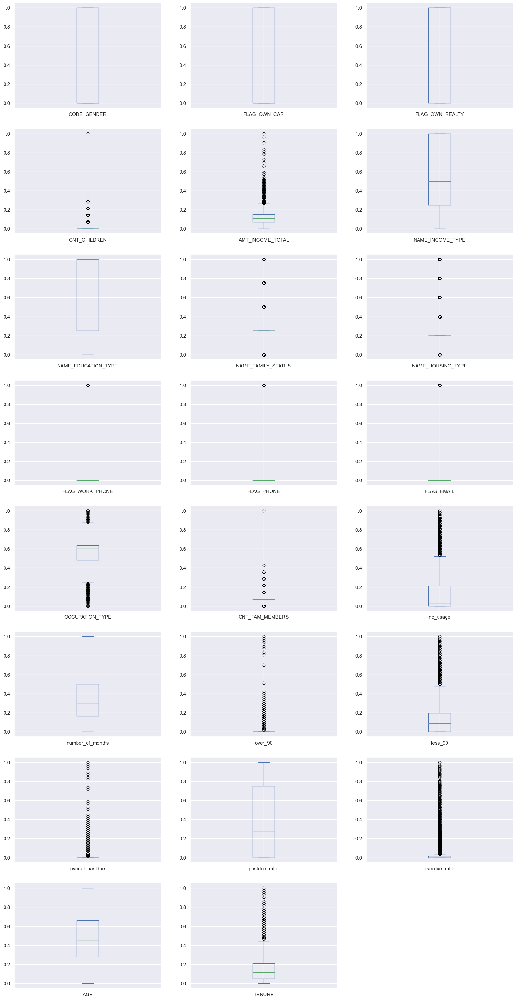

In [152]:
norm_train.plot(kind='box', subplots=True, layout=(12,3), sharex=True, sharey=False, figsize=(20, 60))
plt.show()

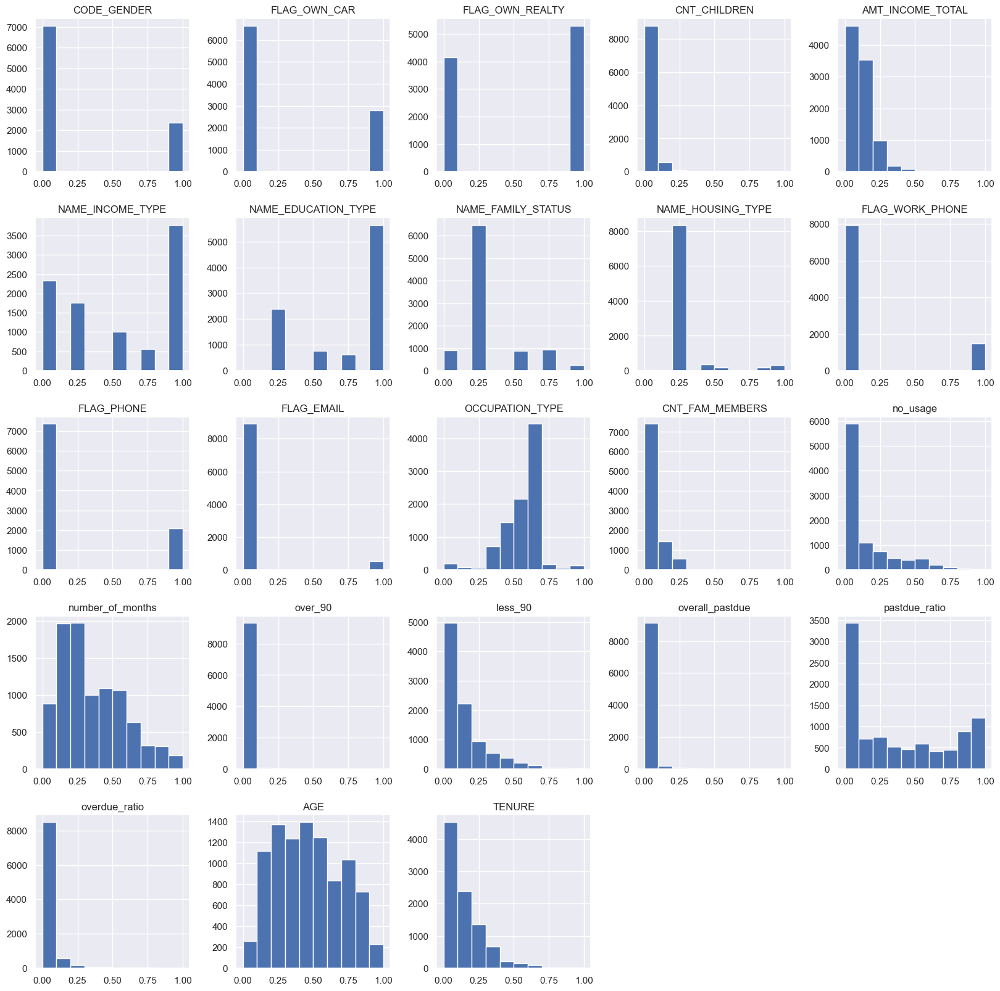

In [153]:
norm_train.hist(figsize=(20, 20))
plt.show()

In [154]:
# create a copy of the target and the features
target = y_smoted.copy()
features = norm_train.copy()

# Remove outliers using the Z-Score method
z_scores = np.abs(stats.zscore(features))
features = features[(z_scores < 3).all(axis=1)]

# Get the cleaned feature indices
cleaned_feature_indices = features.index

# Combine the target with the cleaned feature index
y_smoted = target.loc[cleaned_feature_indices]
features.reset_index()

# Print the number of rows in the dataframe before and after Z-Score outlier removal
print("PRE Z-SCORE OUTLIER REMOVAL ROWS: {}".format(norm_train.shape[0]))
print("POST Z-SCORE OUTLIER REMOVAL ROWS: {}".format(features.shape[0]))

PRE Z-SCORE OUTLIER REMOVAL ROWS: 9446
POST Z-SCORE OUTLIER REMOVAL ROWS: 7104


In [155]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7104 entries, 1 to 9443
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          7104 non-null   float64
 1   FLAG_OWN_CAR         7104 non-null   float64
 2   FLAG_OWN_REALTY      7104 non-null   float64
 3   CNT_CHILDREN         7104 non-null   float64
 4   AMT_INCOME_TOTAL     7104 non-null   float64
 5   NAME_INCOME_TYPE     7104 non-null   float64
 6   NAME_EDUCATION_TYPE  7104 non-null   float64
 7   NAME_FAMILY_STATUS   7104 non-null   float64
 8   NAME_HOUSING_TYPE    7104 non-null   float64
 9   FLAG_WORK_PHONE      7104 non-null   float64
 10  FLAG_PHONE           7104 non-null   float64
 11  FLAG_EMAIL           7104 non-null   float64
 12  OCCUPATION_TYPE      7104 non-null   float64
 13  CNT_FAM_MEMBERS      7104 non-null   float64
 14  no_usage             7104 non-null   float64
 15  number_of_months     7104 non-null   f

In [156]:
#dropping features which construct the depandent variable 'class' 
#also dropping the CNT_CHILDREN as highly correlated to CNT_FAM_MEMBER
processed_train = features.drop(['over_90','less_90','overdue_ratio','pastdue_ratio','CNT_CHILDREN'], axis=1)

In [157]:
#filter method - Chi-Squared
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


In [158]:
#feature extraction
test = SelectKBest(score_func=chi2, k= 13)
fit = test.fit(processed_train, y_smoted)

In [159]:
#summarize scores
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(processed_train.columns)

In [160]:
#summarize selected features
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Chi_Score'] 
print(featureScores.nlargest(30,'Chi_Score')) 

                Feature   Chi_Score
13             no_usage  454.188132
0           CODE_GENDER  247.930246
8       FLAG_WORK_PHONE  244.988094
9            FLAG_PHONE  233.835948
1          FLAG_OWN_CAR  222.099394
2       FLAG_OWN_REALTY  168.493392
4      NAME_INCOME_TYPE   22.738354
15      overall_pastdue   12.078518
12      CNT_FAM_MEMBERS   11.366079
5   NAME_EDUCATION_TYPE    7.163824
14     number_of_months    6.848547
6    NAME_FAMILY_STATUS    5.046157
11      OCCUPATION_TYPE    1.413573
16                  AGE    1.000577
7     NAME_HOUSING_TYPE    0.918731
3      AMT_INCOME_TOTAL    0.353452
17               TENURE    0.002755
10           FLAG_EMAIL         NaN


In [161]:
#wrapper method - RFE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [162]:
# Feature extraction
model = LogisticRegression(solver='liblinear')
rfe = RFE(model, n_features_to_select=13)
fit = rfe.fit(processed_train, y_smoted)
print("Num Feature: %s" % (fit.n_features_))

Num Feature: 13


In [163]:
selected = pd.DataFrame(fit.support_)
dfcolumns = pd.DataFrame(processed_train.columns)
rankings = pd.DataFrame(fit.ranking_)
choosenwrap = pd.concat([dfcolumns,selected,rankings],axis=1)
choosenwrap.columns = ['Feature','RFE_Selected','RFE_Ranks'] 
print(choosenwrap.nlargest(30,'RFE_Ranks')) 

                Feature  RFE_Selected  RFE_Ranks
10           FLAG_EMAIL         False          6
5   NAME_EDUCATION_TYPE         False          5
17               TENURE         False          4
4      NAME_INCOME_TYPE         False          3
7     NAME_HOUSING_TYPE         False          2
11      OCCUPATION_TYPE          True          1
16                  AGE          True          1
15      overall_pastdue          True          1
14     number_of_months          True          1
13             no_usage          True          1
12      CNT_FAM_MEMBERS          True          1
0           CODE_GENDER          True          1
1          FLAG_OWN_CAR          True          1
8       FLAG_WORK_PHONE          True          1
6    NAME_FAMILY_STATUS          True          1
3      AMT_INCOME_TOTAL          True          1
2       FLAG_OWN_REALTY          True          1
9            FLAG_PHONE          True          1


In [164]:
#extra trees forest
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier(n_estimators=14)
model.fit(processed_train, y_smoted)
feature_importances = pd.DataFrame(model.feature_importances_)
featuretree = pd.concat([dfcolumns,feature_importances],axis=1)
featuretree.columns = ['Feature','XTree_Classifier'] 
print(featuretree.nlargest(30,'XTree_Classifier'))

                Feature  XTree_Classifier
13             no_usage          0.303613
15      overall_pastdue          0.114038
14     number_of_months          0.100253
3      AMT_INCOME_TOTAL          0.047337
2       FLAG_OWN_REALTY          0.045098
16                  AGE          0.043949
4      NAME_INCOME_TYPE          0.041842
5   NAME_EDUCATION_TYPE          0.039614
11      OCCUPATION_TYPE          0.039140
12      CNT_FAM_MEMBERS          0.036871
17               TENURE          0.036858
8       FLAG_WORK_PHONE          0.032264
0           CODE_GENDER          0.029548
6    NAME_FAMILY_STATUS          0.027570
1          FLAG_OWN_CAR          0.026340
9            FLAG_PHONE          0.025542
7     NAME_HOUSING_TYPE          0.010122
10           FLAG_EMAIL          0.000000


In [165]:
dff=pd.merge(featureScores, choosenwrap, on=["Feature"])
feature_selection_df = pd.merge(dff, featuretree, on=["Feature"])
feature_selection_df.sort_values(by="XTree_Classifier",ascending=False)

,Feature,Chi_Score,RFE_Selected,RFE_Ranks,XTree_Classifier
13,no_usage,454.188132,True,1,0.303613
15,overall_pastdue,12.078518,True,1,0.114038
14,number_of_months,6.848547,True,1,0.100253
3,AMT_INCOME_TOTAL,0.353452,True,1,0.047337
2,FLAG_OWN_REALTY,168.493392,True,1,0.045098
16,AGE,1.000577,True,1,0.043949
4,NAME_INCOME_TYPE,22.738354,False,3,0.041842
5,NAME_EDUCATION_TYPE,7.163824,False,5,0.039614
11,OCCUPATION_TYPE,1.413573,True,1,0.039140
12,CNT_FAM_MEMBERS,11.366079,True,1,0.036871


In [168]:
#dropping features used in modeling were selected according to feature selection methods
processed_train = processed_train.drop(['FLAG_EMAIL','NAME_HOUSING_TYPE'], axis=1)

In [169]:
processed_train.corr()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,FLAG_WORK_PHONE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,no_usage,number_of_months,overall_pastdue,AGE,TENURE
CODE_GENDER,1.000000,0.408522,0.011260,0.243214,0.130129,0.048518,-0.015147,0.123738,0.021237,0.061407,0.150032,-0.099414,0.038878,-0.000939,-0.174379,0.041973
FLAG_OWN_CAR,0.408522,1.000000,0.055362,0.194812,0.097332,-0.013634,-0.057910,0.113253,0.041303,-0.065296,0.161144,-0.069387,0.044438,-0.055194,-0.130751,0.054119
FLAG_OWN_REALTY,0.011260,0.055362,1.000000,0.007526,-0.041467,0.026682,0.056579,-0.099023,0.010250,0.063831,0.057150,-0.145253,-0.013999,-0.065320,0.128959,-0.052460
AMT_INCOME_TOTAL,0.243214,0.194812,0.007526,1.000000,-0.072290,-0.254718,0.023010,-0.055810,-0.021274,-0.067483,-0.007142,0.030722,0.019250,0.048907,-0.121643,0.129487
NAME_INCOME_TYPE,0.130129,0.097332,-0.041467,-0.072290,1.000000,0.088279,0.007608,0.170240,0.036080,-0.059761,0.103063,-0.046227,-0.018426,-0.014939,-0.241495,0.204023
NAME_EDUCATION_TYPE,0.048518,-0.013634,0.026682,-0.254718,0.088279,1.000000,-0.003922,0.032614,-0.004711,0.116560,-0.008982,-0.061498,0.006034,-0.014895,0.179640,-0.002078
NAME_FAMILY_STATUS,-0.015147,-0.057910,0.056579,0.023010,0.007608,-0.003922,1.000000,-0.015924,0.010455,0.021483,-0.460794,-0.106930,-0.036672,0.023416,0.031713,-0.026665
FLAG_WORK_PHONE,0.123738,0.113253,-0.099023,-0.055810,0.170240,0.032614,-0.015924,1.000000,0.296396,-0.097580,0.126727,-0.063651,0.051979,-0.029987,-0.175125,0.139362
FLAG_PHONE,0.021237,0.041303,0.010250,-0.021274,0.036080,-0.004711,0.010455,0.296396,1.000000,0.009277,0.048731,-0.120025,0.026222,-0.031167,0.059513,0.004478
OCCUPATION_TYPE,0.061407,-0.065296,0.063831,-0.067483,-0.059761,0.116560,0.021483,-0.097580,0.009277,1.000000,-0.033229,-0.107901,-0.024763,-0.010771,0.199174,-0.126607


In [170]:
processed_train.skew()

CODE_GENDER            1.112186
FLAG_OWN_CAR           0.921396
FLAG_OWN_REALTY       -0.210662
AMT_INCOME_TOTAL       0.938724
NAME_INCOME_TYPE      -0.059111
NAME_EDUCATION_TYPE   -0.750428
NAME_FAMILY_STATUS     1.144069
FLAG_WORK_PHONE        1.926611
FLAG_PHONE             1.394226
OCCUPATION_TYPE       -0.697845
CNT_FAM_MEMBERS        0.640086
no_usage               1.387526
number_of_months       0.760455
overall_pastdue        3.832561
AGE                    0.194931
TENURE                 1.080178
dtype: float64

In [172]:
processed_train.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,FLAG_WORK_PHONE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,no_usage,number_of_months,overall_pastdue,AGE,TENURE
count,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000,7104.000000
mean,0.257038,0.290822,0.552365,0.117446,0.542019,0.757848,0.289133,0.153153,0.214105,0.564727,0.075410,0.138299,0.334223,0.006757,0.475336,0.133606
std,0.437031,0.454174,0.497285,0.062578,0.412238,0.323153,0.179847,0.360160,0.410229,0.108445,0.054938,0.186113,0.214825,0.017882,0.229516,0.117177
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.148993,0.000000,0.000000,0.000000,0.000000,0.021277,0.000000
25%,0.000000,0.000000,0.000000,0.071429,0.250000,0.500000,0.250000,0.000000,0.000000,0.505203,0.071429,0.000000,0.166667,0.000000,0.297872,0.046512
50%,0.000000,0.000000,1.000000,0.101336,0.500000,1.000000,0.250000,0.000000,0.000000,0.609755,0.071429,0.032787,0.283333,0.000000,0.446809,0.116279
75%,1.000000,1.000000,1.000000,0.149660,1.000000,1.000000,0.250000,0.000000,0.000000,0.639423,0.071429,0.213115,0.483333,0.000000,0.659574,0.209302
max,1.000000,1.000000,1.000000,0.353741,1.000000,1.000000,0.750000,1.000000,1.000000,0.967220,0.214286,0.737705,1.000000,0.142857,1.000000,0.534884


In [176]:
x_train = processed_train.copy()
y_train = y_smoted.copy()

In [171]:
#modeling - Logistic Regression, K-Nearest Neighbors, Support Vector Machine (SVM), Decision Tree, Random Forest
from sklearn.metrics import accuracy_score, confusion_matrix,precision_score,recall_score,roc_auc_score,f1_score,roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [177]:
model=svm.NuSVC()
# x,x_valid,y,y_valid=train_test_split(x_train,y_train,test_size=0.2)
model.fit(x_train,y_train)
# Calculate train accuracy 
y_train_pred=model.predict(x_train)
print(f'Train accuracy score = {accuracy_score(y_train,y_train_pred)}')
print(f'Train f1_score = {f1_score(y_train,y_train_pred)}')
print(f'Train roc_auc_score = {roc_auc_score(y_train,y_train_pred)}')
# Calculate test accuracy
y_test_pred=model.predict(x_test)
print(f'test accuracy score = {accuracy_score(y_test,y_test_pred)}')
print(f'test f1_score = {f1_score(y_test,y_test_pred)}')
print(f'test roc_auc_score = {roc_auc_score(y_test,y_test_pred)}')

Train accuracy score = 0.8476914414414415
Train f1_score = 0.8461319681456201
Train roc_auc_score = 0.848883704796429


ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- CNT_CHILDREN
- DAYS_BIRTH
- DAYS_EMPLOYED
- FLAG_EMAIL
- FLAG_MOBIL
- ...
Feature names seen at fit time, yet now missing:
- AGE
- TENURE
